In [1]:
%load_ext autoreload
%autoreload 2

import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
import skimage as ski
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

Image.MAX_IMAGE_PIXELS = None

## SAM Set-up

In [2]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [3]:
np.random.seed(3)

def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask 
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
            # Try to smooth contours
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0, 0, 1, 0.4), thickness=1) 

    ax.imshow(img)

In [4]:
sam2_checkpoint = "../sam_checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)

## LPE00

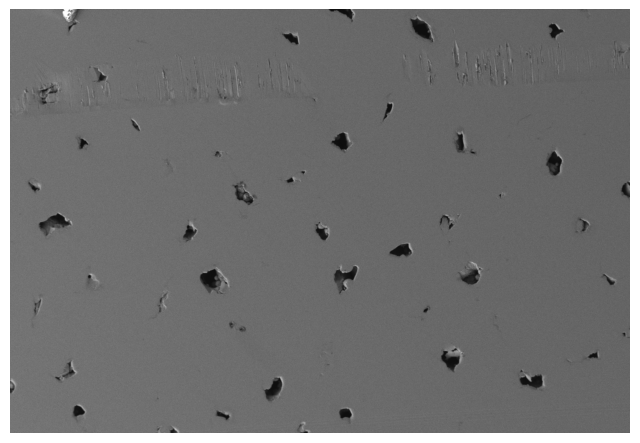

In [15]:
LPE00_fn = "../data/raw/20240724_LPE00_ArmSample_001_SESI.tif"
LPE00_img = Image.open(LPE00_fn)
LPE00_crops = [0, 0, 2048, 1400]
LPE00_crpd = LPE00_img.crop(LPE00_crops)
LPE00_RGB = np.array(LPE00_crpd.convert("RGB"))

# plot the image
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(LPE00_crpd, cmap="gray", origin="lower")
ax.axis("off")
plt.show()


In [35]:
mask_generator = SAM2AutomaticMaskGenerator(
    model=sam2,
    points_per_side=64,
    points_per_batch=64,
    pred_iou_thresh=0.4,
    stability_score_thresh=0.95,
    stability_score_offset=1.0,
    crop_n_layers=0,
    box_nms_thresh=0.7,
    min_mask_region_area=10,
    use_m2m=True,
)

In [36]:
masks = mask_generator.generate(LPE00_RGB)

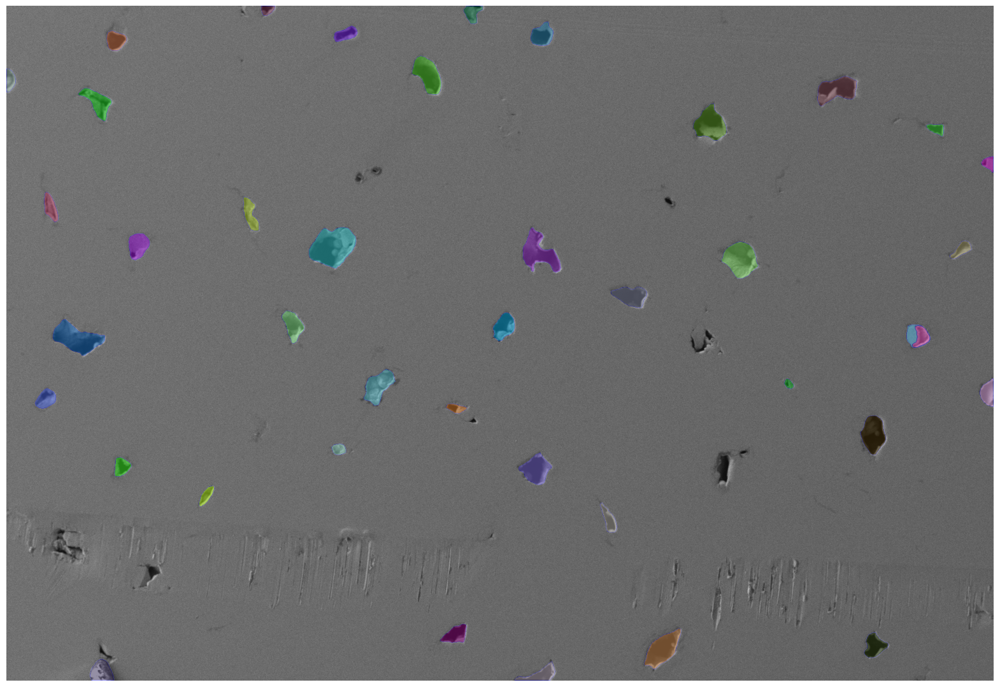

In [37]:
plt.figure(figsize=(20, 20))
plt.imshow(LPE00_RGB)
show_anns(masks)
plt.axis('off')
plt.show()

## CAM01

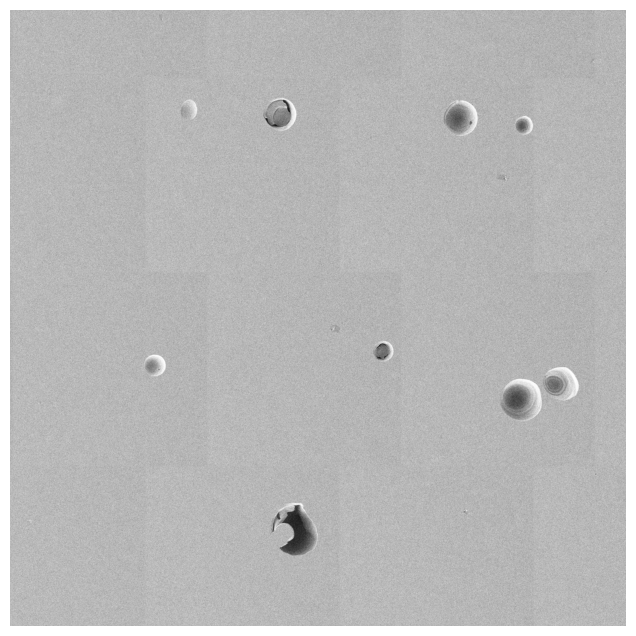

In [39]:
CAM01_fn = "../data/raw/20241210_CAM01_Site3_SESI_Map.tif"
CAM01_img = Image.open(CAM01_fn)
CAM01_crops = [4000, 4000, 8000, 8000]
CAM01_crpd = CAM01_img.crop(CAM01_crops)
CAM01_RGB = np.array(CAM01_crpd.convert("RGB"))

# plot the image
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(CAM01_crpd, cmap="gray", origin="lower")
ax.axis("off")
plt.show()


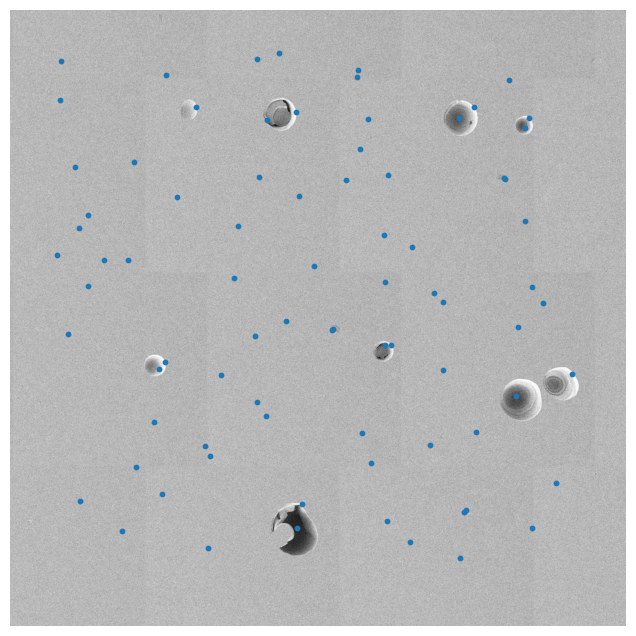

In [58]:
CAM01_arr = np.array(CAM01_crpd)
CAM01_fltrd = ski.filters.gaussian(CAM01_arr, sigma=1)

min_coords = ski.feature.peak_local_max(ski.util.invert(CAM01_fltrd), min_distance=250)
max_coords = ski.feature.peak_local_max(CAM01_fltrd, min_distance=250)

coords = np.vstack((min_coords, max_coords))

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(CAM01_crpd, cmap="gray", origin="lower")
ax.axis("off")
ax.scatter(coords[:, 1], coords[:, 0], s=10)
plt.show()

In [69]:
mask_generator = SAM2AutomaticMaskGenerator(
    model=sam2,
    points_grid=coords,
    points_per_batch=64,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.90,
    stability_score_offset=1.0,
    crop_n_layers=0,
    box_nms_thresh=0.9,
    min_mask_region_area=25.0,
    use_m2m=True
)

In [70]:
masks = mask_generator.generate(CAM01_RGB)

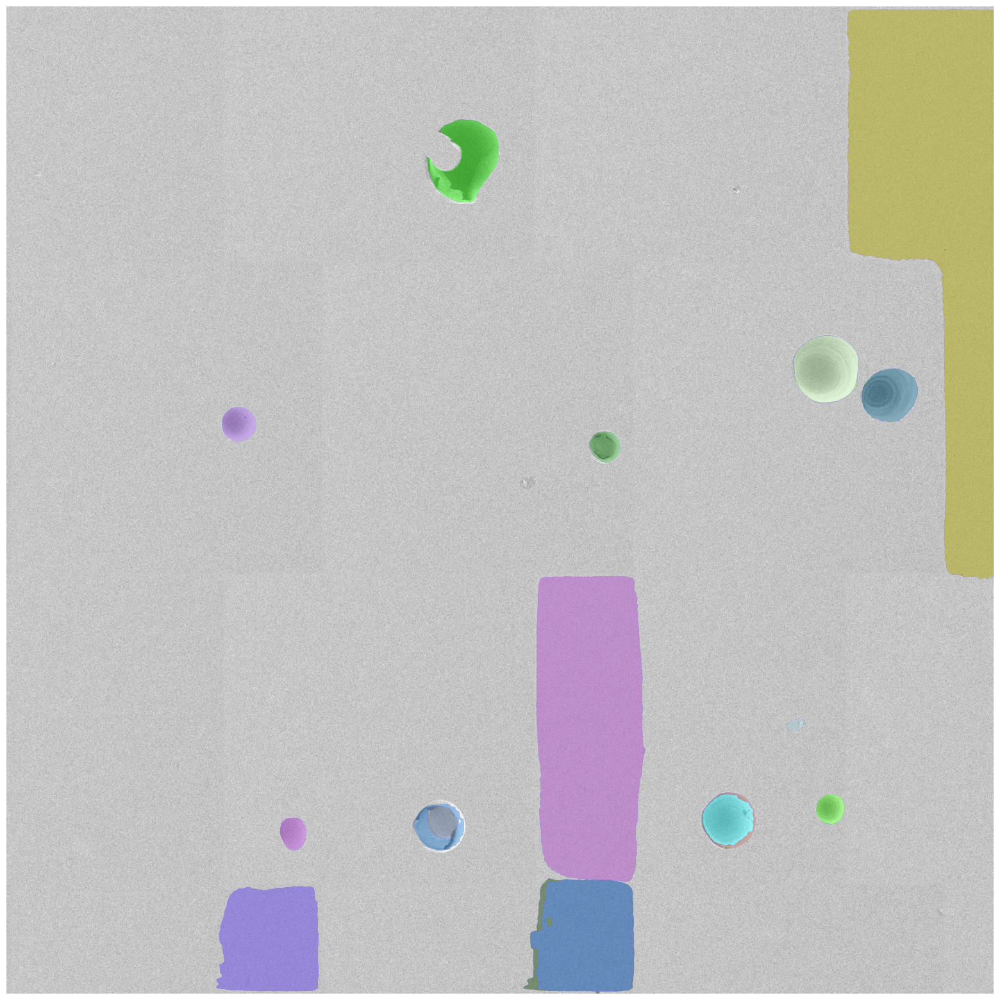

In [71]:
plt.figure(figsize=(20, 20))
plt.imshow(CAM01_RGB)
show_anns(masks)
plt.axis('off')
plt.show()

## IAFLAT

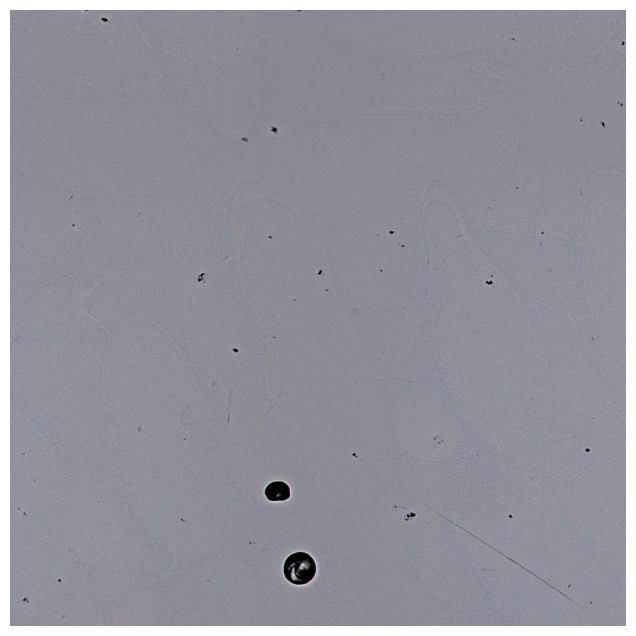

In [79]:
IAFLAT_fn = "../data/raw/Acquisition_08.tif"
IAFLAT_img = Image.open(IAFLAT_fn)
IAFLAT_crops = [3000, 3000, 4000, 4000]
IAFLAT_crpd = IAFLAT_img.crop(IAFLAT_crops)
IAFLAT_RGB = np.array(IAFLAT_crpd.convert("RGB"))

# plot the image
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(IAFLAT_crpd, cmap="gray", origin="lower")
ax.axis("off")
plt.show()


0


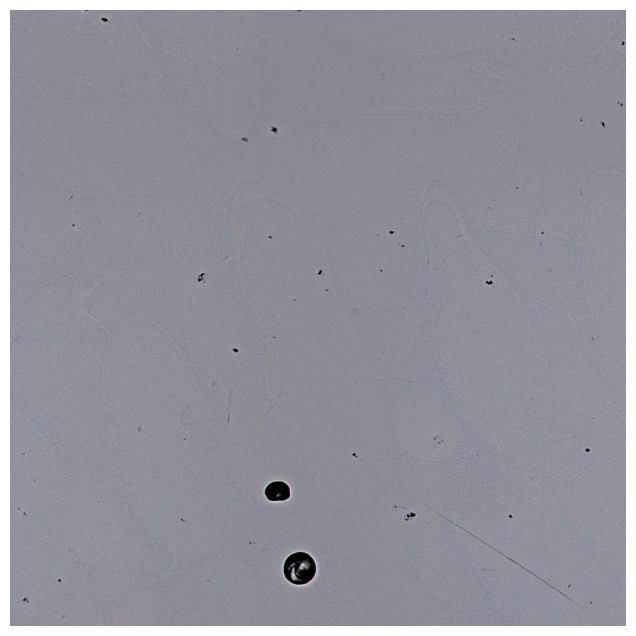

In [80]:
IAFLAT_arr = np.array(IAFLAT_crpd)
IAFLAT_fltrd = ski.filters.gaussian(IAFLAT_arr, sigma=1)

min_coords = ski.feature.peak_local_max(ski.util.invert(IAFLAT_fltrd), min_distance=25)
print(len(min_coords))

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(IAFLAT_crpd, cmap="gray", origin="lower")
ax.axis("off")
ax.scatter(min_coords[:, 1], min_coords[:, 0], s=10)
plt.show()

In [86]:
mask_generator = SAM2AutomaticMaskGenerator(
    model=sam2,
    points_per_side=64,
    points_per_batch=64,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.95,
    stability_score_offset=1.0,
    crop_n_layers=0,
    box_nms_thresh=0.7,
    min_mask_region_area=5,
    use_m2m=True,
)

In [87]:
masks = mask_generator.generate(IAFLAT_RGB)

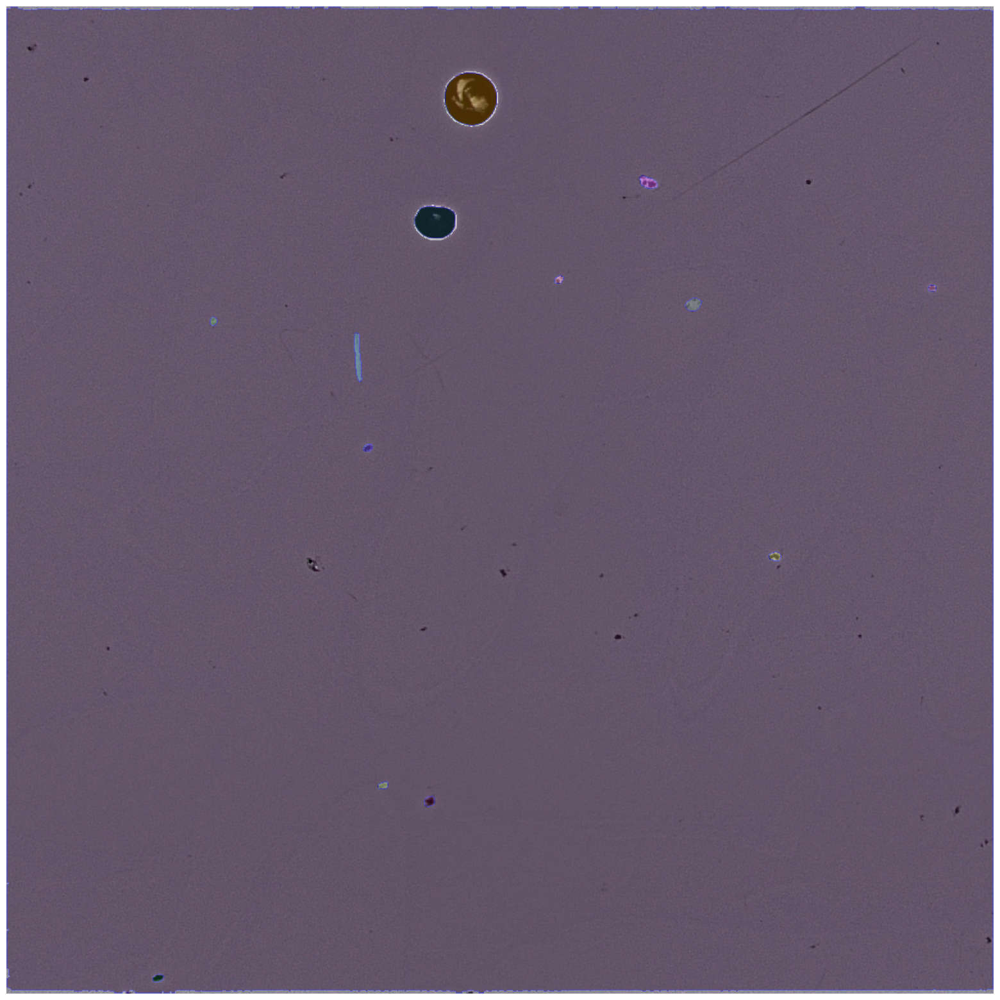

In [88]:
plt.figure(figsize=(20, 20))
plt.imshow(IAFLAT_RGB)
show_anns(masks)
plt.axis('off')
plt.show()